``Get data through STAC api``

# Import dependencies and meatadata

In [6]:
import planetary_computer as pc
from pystac_client.client import Client
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import geopandas as gpd
import geopy.distance as distance
from datetime import timedelta


import cv2
import odc.stac

import rioxarray
import rasterio as rio
from tqdm import tqdm
from pathlib import Path
from IPython.display import Image
from PIL import Image as PILImage

In [3]:
catalog = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1", modifier=pc.sign_inplace
)

In [4]:
train_labels = pd.read_csv('../data/train_labels.csv')
metadata = pd.read_csv('../data/metadata.csv')
metadata.head()

,uid,latitude,longitude,date,split
0,aabm,39.080319,-86.430867,2018-05-14,train
1,aabn,36.559700,-121.510000,2016-08-31,test
2,aacd,35.875083,-78.878434,2020-11-19,train
3,aaee,35.487000,-79.062133,2016-08-24,train
4,aaff,38.049471,-99.827001,2019-07-23,train


In [5]:
example_row = metadata[metadata.uid == "garm"].iloc[0]
example_row

uid                garm
latitude       41.98006
longitude    -110.65734
date         2021-09-27
split             train
Name: 5461, dtype: object

# Get stas

In [7]:
# get our bounding box to search latitude and longitude coordinates
def get_bounding_box(latitude, longitude, meter_buffer=1_000):
    """
    Given a latitude, longitude, and buffer in meters, returns a bounding
    box around the point with the buffer on the left, right, top, and bottom.

    Returns a list of [minx, miny, maxx, maxy]
    """
    distance_search = distance.distance(meters=meter_buffer)

    # calculate the lat/long bounds based on ground distance
    # bearings are cardinal directions to move (south, west, north, and east)
    min_lat = distance_search.destination((latitude, longitude), bearing=180)[0]
    min_long = distance_search.destination((latitude, longitude), bearing=270)[1]
    max_lat = distance_search.destination((latitude, longitude), bearing=0)[0]
    max_long = distance_search.destination((latitude, longitude), bearing=90)[1]

    return [min_long, min_lat, max_long, max_lat]

In [6]:
bbox = get_bounding_box(example_row.latitude, example_row.longitude, meter_buffer=50_000)
bbox

[-111.26063646639783,
 41.52988747516146,
 -110.05404353360218,
 42.43019710235757]

In [7]:
# get our date range to search, and format correctly for query
def get_date_range(date, time_buffer_days=15):
    """Get a date range to search for in the planetary computer based
    on a sample's date. The time range will include the sample date
    and time_buffer_days days prior

    Returns a string"""
    datetime_format = "%Y-%m-%dT"
    range_start = pd.to_datetime(date) - timedelta(days=time_buffer_days)
    date_range = f"{range_start.strftime(datetime_format)}/{pd.to_datetime(date).strftime(datetime_format)}"

    return date_range


date_range = get_date_range(example_row.date)
date_range


'2021-09-12T/2021-09-27T'

In [9]:
# search the planetary computer sentinel-l2a and landsat level-2 collections
search = catalog.search(
    collections=["sentinel-2-l2a", "landsat-c2-l2"], bbox=bbox, datetime=date_range
)

# see how many items were returned
items = [item for item in search.get_all_items()]
len(items)

46

In [10]:
# get details of all of the items returned into a dataframe
item_details = pd.DataFrame(
    [
        {
            "datetime": item.datetime.strftime("%Y-%m-%d"),
            "platform": item.properties["platform"],
            "min_long": item.bbox[0],
            "max_long": item.bbox[2],
            "min_lat": item.bbox[1],
            "max_lat": item.bbox[3],
            "bbox": item.bbox,
            "item_obj": item,
        }
        for item in items
    ]
)

# check which rows actually contain the sample location
item_details["contains_sample_point"] = (
    (item_details.min_lat < example_row.latitude)
    & (item_details.max_lat > example_row.latitude)
    & (item_details.min_long < example_row.longitude)
    & (item_details.max_long > example_row.longitude)
)

print(
    f"Filtering from {len(item_details)} returned to {item_details.contains_sample_point.sum()} items that contain the sample location"
)

item_details = item_details[item_details["contains_sample_point"]]
item_details[["datetime", "platform", "contains_sample_point", "bbox"]].sort_values(
    by="datetime"
)

Filtering from 46 returned to 7 items that contain the sample location


,datetime,platform,contains_sample_point,bbox
44,2021-09-12,landsat-8,True,"[-111.34023745, 40.67702495, -108.51528663, 42..."
34,2021-09-14,Sentinel-2A,True,"[-111.000244, 41.45624189757688, -109.665115, ..."
21,2021-09-19,Sentinel-2B,True,"[-111.000244, 41.45624189757688, -109.665115, ..."
26,2021-09-19,landsat-8,True,"[-112.92522743, 40.67353498, -110.06644659, 42..."
18,2021-09-20,landsat-7,True,"[-111.60018779, 40.80284495, -108.59831681, 42..."
8,2021-09-24,Sentinel-2A,True,"[-111.000244, 41.4562419, -109.665115, 42.4526..."
5,2021-09-27,landsat-7,True,"[-113.18385774, 40.78803499, -110.15150674, 42..."


In [11]:
# 1 - filter to sentinel
item_details[item_details.platform.str.contains("Sentinel")]

,datetime,platform,min_long,max_long,min_lat,max_lat,bbox,item_obj,contains_sample_point
8,2021-09-24,Sentinel-2A,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.4562419, -109.665115, 42.4526...",<Item id=S2A_MSIL2A_20210924T181101_R084_T12TW...,True
21,2021-09-19,Sentinel-2B,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.45624189757688, -109.665115, ...",<Item id=S2B_MSIL2A_20210919T180919_R084_T12TW...,True
34,2021-09-14,Sentinel-2A,-111.000244,-109.665115,41.456242,42.452691,"[-111.000244, 41.45624189757688, -109.665115, ...",<Item id=S2A_MSIL2A_20210914T180951_R084_T12TW...,True


In [12]:
# 2 - take closest by date
best_item = (
    item_details[item_details.platform.str.contains("Sentinel")]
    .sort_values(by="datetime", ascending=False)
    .iloc[0]
)
best_item

datetime                                                        2021-09-24
platform                                                       Sentinel-2A
min_long                                                       -111.000244
max_long                                                       -109.665115
min_lat                                                          41.456242
max_lat                                                          42.452691
bbox                     [-111.000244, 41.4562419, -109.665115, 42.4526...
item_obj                 <Item id=S2A_MSIL2A_20210924T181101_R084_T12TW...
contains_sample_point                                                 True
Name: 8, dtype: object

In [13]:
item = best_item.item_obj
item

ID: S2A_MSIL2A_20210924T181101_R084_T12TWM_20210925T141709
"Bounding Box: [-111.000244, 41.4562419, -109.665115, 42.4526912]"
Datetime: 2021-09-24 18:11:01.024000+00:00
datetime: 2021-09-24T18:11:01.024000Z
platform: Sentinel-2A
proj:epsg: 32612
instruments: ['msi']
s2:mgrs_tile: 12TWM
constellation: Sentinel 2
s2:granule_id: S2A_OPER_MSI_L2A_TL_ESRI_20210925T141710_A032685_T12TWM_N03.00
eo:cloud_cover: 0.171977


In [16]:
# What assets are available?
for asset_key, asset in item.assets.items():
    print(f"{asset_key :<25} - {asset.title}")

AOT                       - Aerosol optical thickness (AOT)
B01                       - Band 1 - Coastal aerosol - 60m
B02                       - Band 2 - Blue - 10m
B03                       - Band 3 - Green - 10m
B04                       - Band 4 - Red - 10m
B05                       - Band 5 - Vegetation red edge 1 - 20m
B06                       - Band 6 - Vegetation red edge 2 - 20m
B07                       - Band 7 - Vegetation red edge 3 - 20m
B08                       - Band 8 - NIR - 10m
B09                       - Band 9 - Water vapor - 60m
B11                       - Band 11 - SWIR (1.6) - 20m
B12                       - Band 12 - SWIR (2.2) - 20m
B8A                       - Band 8A - Vegetation red edge 4 - 20m
SCL                       - Scene classfication map (SCL)
WVP                       - Water vapour (WVP)
visual                    - True color image
preview                   - Thumbnail
safe-manifest             - SAFE manifest
granule-metadata          - Granul

In [18]:
# see the whole image
img = Image(url=item.assets["rendered_preview"].href, width=500)
img

In [19]:
def crop_sentinel_image(item, bounding_box):
    """
    Given a STAC item from Sentinel-2 and a bounding box tuple in the format
    (minx, miny, maxx, maxy), return a cropped portion of the item's visual
    imagery in the bounding box.

    Returns the image as a numpy array with dimensions (color band, height, width)
    """
    (minx, miny, maxx, maxy) = bounding_box

    image = rioxarray.open_rasterio(pc.sign(item.assets["visual"].href)).rio.clip_box(
        minx=minx,
        miny=miny,
        maxx=maxx,
        maxy=maxy,
        crs="EPSG:4326",
    )

    return image.to_numpy()


In [20]:
# get a smaller geographic bounding box
minx, miny, maxx, maxy = get_bounding_box(
    example_row.latitude, example_row.longitude, meter_buffer=2_000
)

# get the zoomed in image array
bbox = (minx, miny, maxx, maxy)
zoomed_img_array = crop_sentinel_image(item, bbox)

zoomed_img_array[0]

array([[104, 107, 113, ...,  99,  93,  88],
       [102, 103, 112, ..., 104,  94,  89],
       [109, 108, 113, ..., 105,  96,  91],
       ...,
       [124, 121, 122, ..., 105, 105, 106],
       [130, 111, 109, ..., 102, 100, 104],
       [152, 135, 128, ..., 103, 101, 102]], dtype=uint8)

In [21]:
zoomed_img_array.shape

(3, 402, 402)

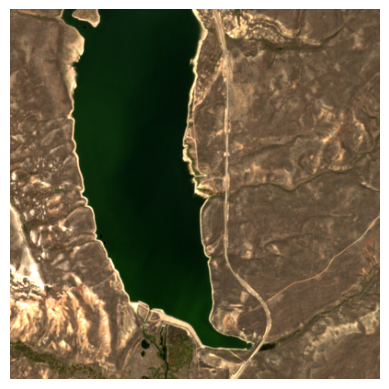

In [49]:
#  transpose some of the dimensions to plot
# matplotlib expects channels in a certain order
plt.imshow(np.transpose(zoomed_img_array, axes=[1, 2, 0]))
plt.axis('off');

In [22]:
landsat_item = (
    item_details[item_details.platform.str.contains("landsat")]
    .sample(n=1, random_state=3)
    .iloc[0]
)
landsat_item

datetime                                                        2021-09-12
platform                                                         landsat-8
min_long                                                       -111.340237
max_long                                                       -108.515287
min_lat                                                          40.677025
max_lat                                                          42.817595
bbox                     [-111.34023745, 40.67702495, -108.51528663, 42...
item_obj                         <Item id=LC08_L2SP_037031_20210912_02_T1>
contains_sample_point                                                 True
Name: 44, dtype: object

In [24]:
def crop_landsat_image(item, bounding_box):
    """
    Given a STAC item from Landsat and a bounding box tuple in the format
    (minx, miny, maxx, maxy), return a cropped portion of the item's visual
    imagery in the bounding box.

    Returns the image as a numpy array with dimensions (color band, height, width)
    """
    (minx, miny, maxx, maxy) = bounding_box

    image = odc.stac.stac_load(
        [pc.sign(item)], bands=["red", "green", "blue"], bbox=[minx, miny, maxx, maxy]
    ).isel(time=0)
    image_array = image[["red", "green", "blue"]].to_array().to_numpy()

    # normalize to 0 - 255 values
    image_array = cv2.normalize(image_array, None, 0, 255, cv2.NORM_MINMAX)

    return image_array

In [26]:
item = landsat_item.item_obj

# we'll use the same cropped area as above
landsat_image_array = crop_landsat_image(item, bbox)
landsat_image_array[0]

array([[88, 88, 92, ..., 84, 85, 84],
       [90, 91, 93, ..., 85, 88, 87],
       [91, 93, 94, ..., 86, 87, 87],
       ...,
       [95, 92, 97, ..., 92, 91, 92],
       [93, 90, 91, ..., 93, 91, 91],
       [94, 93, 91, ..., 92, 91, 90]], dtype=uint16)

In [27]:
landsat_image_array.shape

(3, 135, 134)

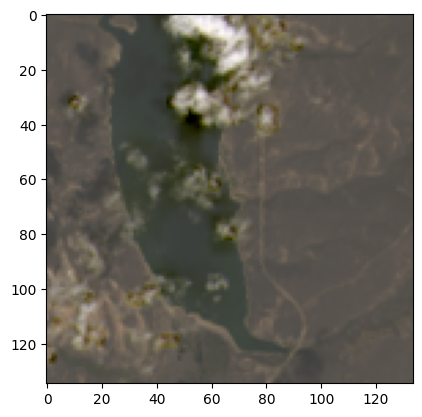

In [28]:
plt.imshow(np.transpose(landsat_image_array, axes=[1, 2, 0]))

In [30]:
image = odc.stac.stac_load(
    [pc.sign(item)], bands=["red", "green", "blue"], bbox=bbox
).isel(time=0)
image_array = image[["red", "green", "blue"]].to_array()

# values are not scaled 0 - 255 when first returned
image_array[0]

<xarray.DataArray (y: 135, x: 134)>
array([[10994, 10979, 11448, ..., 10523, 10576, 10505],
       [11163, 11362, 11575, ..., 10646, 10927, 10781],
       [11379, 11558, 11659, ..., 10734, 10827, 10859],
       ...,
       [11829, 11425, 12074, ..., 11499, 11365, 11424],
       [11556, 11260, 11322, ..., 11559, 11357, 11294],
       [11680, 11608, 11393, ..., 11477, 11398, 11255]], dtype=uint16)
Coordinates:
  * y            (y) float64 4.65e+06 4.65e+06 4.65e+06 ... 4.646e+06 4.646e+06
  * x            (x) float64 5.264e+05 5.264e+05 ... 5.304e+05 5.304e+05
    spatial_ref  int32 32612
    time         datetime64[ns] 2021-09-12T18:01:53.979983
    variable     <U3 'red'

In [31]:
image_array.shape

(3, 135, 134)

(526380.0, 530400.0, 4645590.0, 4649640.0)

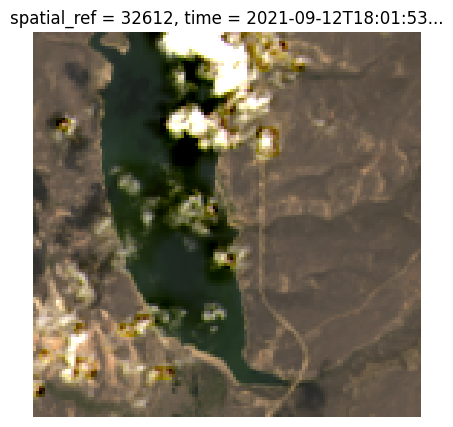

In [32]:
# image appears differently without rescaling
fig, ax = plt.subplots(figsize=(5, 5))
image_array.plot.imshow(robust=True, ax=ax)
plt.axis('off')

# Image Analysis

In [8]:
IMG_DIR = '../data/imgs/'

import os
files = os.listdir(IMG_DIR)
len(files)

89

In [9]:
def plot_randimg(choice):
    print(choice)
    file = files[choice]
    file_name = os.path.join(IMG_DIR, file)
    print(file)
    arr = np.load(file=file_name)
    print(arr.shape)
    plt.imshow(np.transpose(arr, axes=[1, 2, 0]))
    plt.axis('off');
    
    data = metadata[metadata.uid == file.split('.')[0]]
    x, y = data.latitude.values, data.longitude.values
    bbox = get_bounding_box(x, y, meter_buffer=2_000)

    print(train_labels[train_labels.uid == file.split('.')[0]])
    return file, arr, (x, y), bbox

73
tvne.npy
(3, 405, 406)
Empty DataFrame
Columns: [uid, region, severity, density]
Index: []


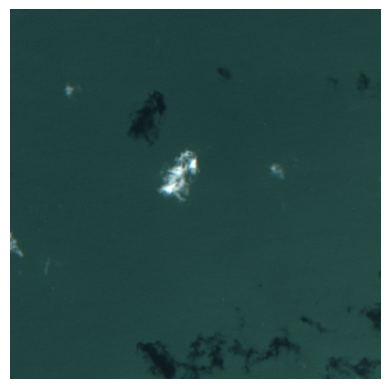

In [26]:
choice = np.random.choice([x for x in range(0, 90)])
_, _, _, _ = plot_randimg(choice)

3
bajg.npy
(3, 414, 415)
      uid region  severity  density
668  bajg   west         2  23916.0


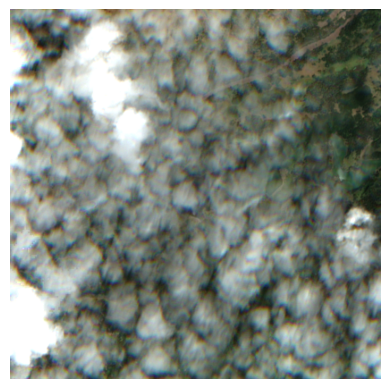

In [20]:
_, _, _, _ = plot_randimg(3)   # mostly cloudy... and could be of no use

45
nuqu.npy
(3, 409, 410)
       uid region  severity  density
9081  nuqu  south         1  19364.0


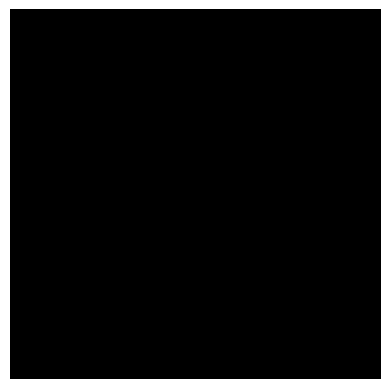

In [11]:
file, arr, (x, y), bbox = plot_randimg(45)
# not a pic of water body, 

14
egqx.npy
(3, 409, 409)
       uid region  severity  density
2822  egqx  south         1    484.0


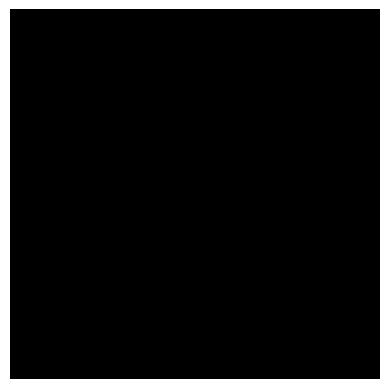

In [12]:
file, arr, (x, y), bbox = plot_randimg(14)
# the lat and long are not of a lake!! but why the black pic tho??!!

41
msdk.npy
(3, 411, 412)
Empty DataFrame
Columns: [uid, region, severity, density]
Index: []


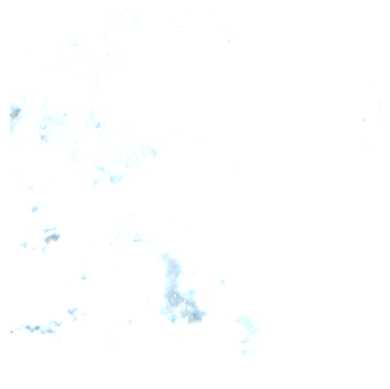

In [17]:
file, arr, (x, y), bbox = plot_randimg(41) # what the heckkk...

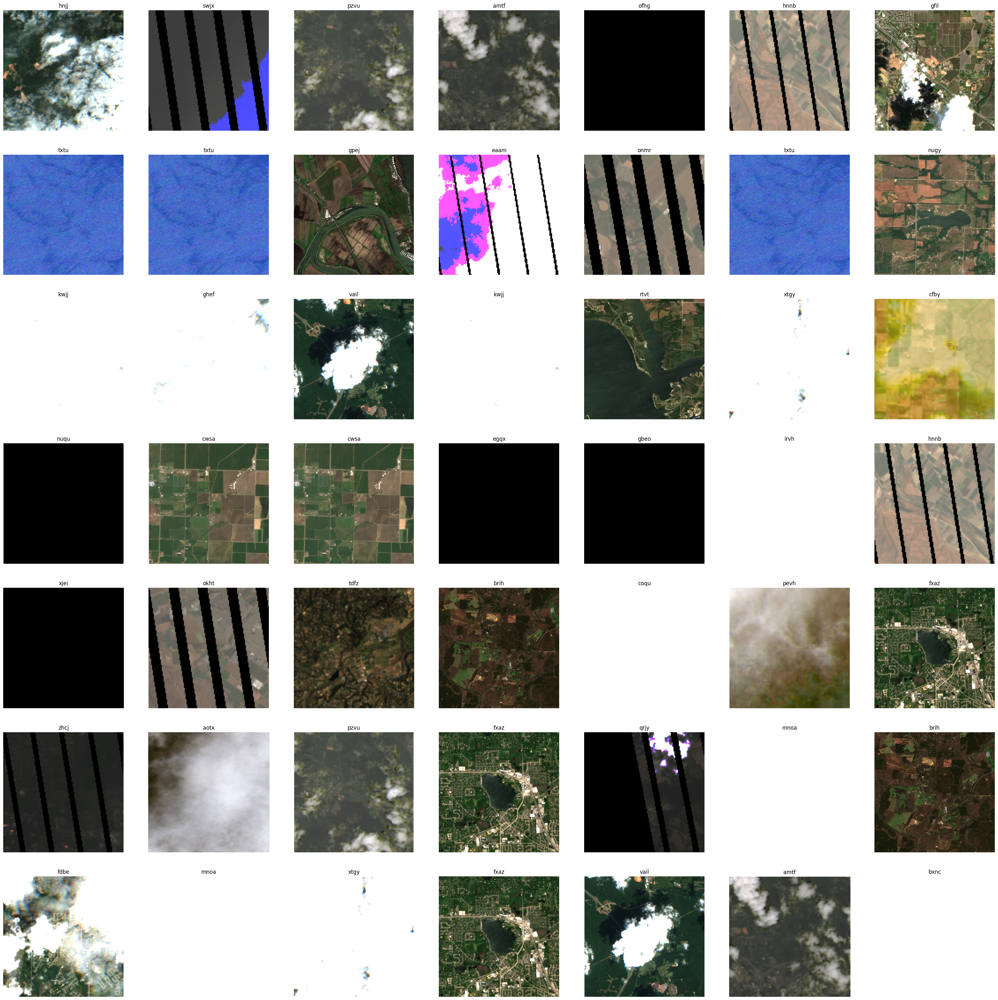

In [27]:
fig, axes = plt.subplots(7, 7, figsize=(40, 40))
for ax in axes.ravel():
    choice = np.random.choice([x for x in range(0, 90)])
    file_name = files[choice]
    img = np.load(f'../data/imgs/{file_name}')
    ax.imshow(np.transpose(img, axes=[2,1,0]))
    ax.set_xlabel(img.shape[1:])
    ax.axis('off');
    filename = file_name.split('.')[0]
    ax.title.set_text(filename)

In [ ]:
# Noo img is clear..!!

In [14]:
import ee
# ee.Authenticate()
# ee.Initialize()

In [18]:
x, y

(array([41.5168]), array([-72.73]))

In [19]:
#  create a map with geemap
import geemap
Map = geemap.Map()
Map.add_basemap("HYBRID")
bbox = ee.Geometry.Rectangle(bbox)
Map.addLayer(bbox, {}, "image_41")
Map

Map(center=[20, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(Togg…